In [75]:
import cv2
import matplotlib.pyplot as plt
import numpy as np
from skimage.measure import ransac
from skimage.transform import AffineTransform, ProjectiveTransform, warp
from skimage.feature import match_descriptors
from skimage import draw 
import matplotlib.patches as patches

import os, pdb
from PIL import Image
import numpy as np
import torch
import sys
sys.path.append('../SAR_R2D2/')

from tools import common

from tools.dataloader import norm_RGB
from nets.patchnet import *

import cv2
import matplotlib.pyplot as plt

from skimage.measure import ransac
from skimage.transform import AffineTransform , ProjectiveTransform, rotate, warp_coords

from skimage.feature import match_descriptors

import torchvision
from skimage.exposure import equalize_adapthist, equalize_hist

In [76]:
def apply_2d_homography(point,h):
    x,y=point
    vec=np.array([x,y,1])
    res = h@vec
    res = res / res[-1]
    return res[:2]


def homographyAddTranslation(h, translation):
    h_t = np.eye(3)
    h_t[0, 2] = translation[1]
    h_t[1, 2] = translation[0]
    return h_t @ h

def crop_image(img,percentile=.6):
    height,width=img.shape[:2]
    h=int(percentile*height/2)
    w=int(percentile*width/2)
    return img[h:-h,w:-w]

def build_checkerboard(size,grid_size):
    height, width = size
    ones = np.ones((grid_size, grid_size))
    zeros = np.zeros((grid_size, grid_size))
    x1 = np.concatenate((ones, zeros), axis=1)
    x2 = np.concatenate((zeros, ones), axis=1)
    x = np.concatenate((x1, x2), axis=0)
    
    n_h = int(height/grid_size/2) +1
    n_w = int(width/grid_size/2) + 1
    board = np.tile(x,(n_h, n_w)).astype('bool')
    
    return board[:height,:width]


def stichImages(img1, img2, h, grid_size=64, inverse=False):
    dst_h, dst_w = img2.shape[:2]
    dst_shape = (dst_w * 3, dst_h * 3)
    h = homographyAddTranslation(h, (dst_h, dst_w))
    transfromed_img1 = cv2.warpPerspective(img1, h, dst_shape)
    transformed_img2 = np.pad(img2, [[dst_h, dst_h], [dst_w, dst_w]])
    mask = build_checkerboard(dst_shape, grid_size)
    if inverse:
        img_registeded = np.where(mask.T, transfromed_img1, transformed_img2)
    else:
        img_registeded = np.where(mask.T, transformed_img2, transfromed_img1)
    img_registeded = crop_image(img_registeded)
    plt.figure(figsize=(14, 10))
    plt.imshow(img_registeded)
    plt.show()
    return 

In [77]:
class NonMaxSuppression (torch.nn.Module):
    def __init__(self, rel_thr=0.7, rep_thr=0.7):
        nn.Module.__init__(self)
        self.max_filter = torch.nn.MaxPool2d(kernel_size=3, stride=1, padding=1)
        self.rel_thr = rel_thr
        self.rep_thr = rep_thr
    
    def forward(self, reliability, repeatability, **kw):
        assert len(reliability) == len(repeatability) == 1
        reliability, repeatability = reliability[0], repeatability[0]

        # local maxima
        maxima = (repeatability == self.max_filter(repeatability))

        # remove low peaks
        maxima *= (repeatability >= self.rep_thr)
        maxima *= (reliability   >= self.rel_thr)

        return maxima.nonzero().t()[2:4]


def extract_multiscale( net, img, detector, scale_f=2**0.25, 
                        min_scale=0.0, max_scale=1, 
                        min_size=256, max_size=1024, 
                        verbose=False):
    old_bm = torch.backends.cudnn.benchmark 
    torch.backends.cudnn.benchmark = False # speedup
    
    # extract keypoints at multiple scales
    B, three, H, W = img.shape
    assert B == 1 and three == 3, "should be a batch with a single RGB image"
    
    assert max_scale <= 1
    s = 1.0 # current scale factor
    
    catched = False
    X,Y,S,C,Q,D = [],[],[],[],[],[]
    while  s+0.001 >= max(min_scale, min_size / max(H,W)):
        if s-0.001 <= min(max_scale, max_size / max(H,W)):
            nh, nw = img.shape[2:]
            if verbose: print(f"extracting at scale x{s:.02f} = {nw:4d}x{nh:3d}")
            # extract descriptors
            with torch.no_grad():
                res = net(imgs=[img])
                
            # get output and reliability map
            descriptors = res['descriptors'][0]
            reliability = res['reliability'][0]
            repeatability = res['repeatability'][0]
            if not catched :
                    ret_reliability = reliability.cpu().detach().numpy().squeeze()
                    ret_repeatability = repeatability.cpu().detach().numpy().squeeze()
                    catched = True
                

            # normalize the reliability for nms
            # extract maxima and descs
            y,x = detector(**res) # nms
            c = reliability[0,0,y,x]
            q = repeatability[0,0,y,x]
            print(descriptors[-1].shape)

            d = descriptors[-1][:,y,x].t()
            # d = descriptors[1][0,:,y,x].t()
            n = d.shape[0]

            # accumulate multiple scales
            X.append(x.float() * W/nw)
            Y.append(y.float() * H/nh)
            S.append((32/s) * torch.ones(n, dtype=torch.float32, device=d.device))
            C.append(c)
            Q.append(q)
            D.append(d)
        s /= scale_f

        # down-scale the image for next iteration
        nh, nw = round(H*s), round(W*s)
        img = F.interpolate(img, (nh,nw), mode='bilinear', align_corners=False)

    # restore value
    torch.backends.cudnn.benchmark = old_bm
    
    Y = torch.cat(Y)
    X = torch.cat(X)
    S = torch.cat(S) # scale
    scores = torch.cat(C) * torch.cat(Q) # scores = reliability * repeatability
    XYS = torch.stack([X,Y,S], dim=-1)
    D = torch.cat(D)
    return XYS, D, scores, ret_reliability, ret_repeatability

In [78]:

def apply_2d_homography(point,h):
    x,y=point
    vec=np.array([x,y,1])
    res = h@vec
    res = res / res[-1]
    return res[:2]

def Metrics(kp1, desc1, kp2, desc2, ResidualThreshold=3, max_trials=3000, transformation=ProjectiveTransform , ground_truth_transformation=None):
#     print(type(desc1), type(desc2))
    matches12 = match_descriptors(desc1, desc2, cross_check=True)
    matches21 = match_descriptors(desc2, desc1, cross_check=True)
    if isinstance(kp1[0], cv2.KeyPoint) and isinstance(kp2[0], cv2.KeyPoint):
        points = pt1 = np.array([kp1[m].pt for m, _ in matches12])
        pt2 = np.array([kp2[n].pt for _, n in matches12])
    else:
        points = pt1 = np.array([kp1[m] for m, _ in matches12])
        pt2 = np.array([kp2[n] for _, n in matches12])
        kp1 = cv2.KeyPoint_convert(kp1)
        kp2 = cv2.KeyPoint_convert(kp2)

    forward_transformation, inliers = ransac(
    (pt1, pt2),
    transformation, min_samples=3,
    residual_threshold=ResidualThreshold,  max_trials=max_trials,
    )
    if isinstance(kp1[0], cv2.KeyPoint) and isinstance(kp2[0], cv2.KeyPoint):
        pt1 = np.array([kp1[n].pt for _, n in matches21])
        pt2 = np.array([kp2[m].pt for m, _ in matches21])
    else:
        pt1 = np.array([kp1[m] for _, n in matches12])
        pt2 = np.array([kp2[n] for m, _ in matches12])
        kp1 = cv2.KeyPoint_convert(kp1)
        kp2 = cv2.KeyPoint_convert(kp2)
    
    backward_transformation, _ = ransac(
    (pt2, pt1),
    transformation, min_samples=3,
    residual_threshold=ResidualThreshold, max_trials=max_trials,
    )
    
    Transform = backward_transformation.params @ forward_transformation.params
    dist_all = 0
    for pt in points:
        predicted_pt = apply_2d_homography(pt,Transform)
        dist_all += np.sum((predicted_pt - pt)**2)
        
    dist_matching_error = 0
    if ground_truth_transformation is not None:
        for pt in points:
            predicted_pt = apply_2d_homography(pt,forward_transformation.params)
            ground_truth_pt = apply_2d_homography(pt, ground_truth_transformation)
            dist_matching_error += np.sum((predicted_pt - ground_truth_pt)**2)**.5

            
    
    N_all = len(matches12)
    N_red = np.sum(inliers)
    rocc = N_red / N_all
    rmse_all = np.sqrt(dist_all/len(points))
    if ground_truth_transformation is not None:
        matching_error = dist_matching_error/len(points)
    else:
        matching_error = -1
        
    kps =  kp1, kp2
    matches = [cv2.DMatch(_queryIdx=m ,_trainIdx=n, _imgIdx=0, _distance=0 ) for m, n in matches12[inliers]]
    return N_red, N_all, rocc, rmse_all, forward_transformation.params, kps, matches, matching_error


In [79]:
reliability_thr = 0.7
repeatability_thr = 0.7

In [80]:
net = Fast_Quad_L2Net_ConfCFS()
checkpoint = torch.load("../Trained_models/SAR_R2D2_NewLoss_saved_model_3200.pt")
net.load_state_dict(checkpoint["model_state_dict"])

<All keys matched successfully>

In [81]:
net

Fast_Quad_L2Net_ConfCFS(
  (ops): ModuleList(
    (0): Conv2d(3, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=False, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (4): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=False, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (7): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=False, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (10): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=False, track_running_stats=True)
    (12): ReLU(inplace=True)
    (13): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (14): BatchNorm

In [11]:
detector = NonMaxSuppression(
    rel_thr = reliability_thr, 
    rep_thr = repeatability_thr)


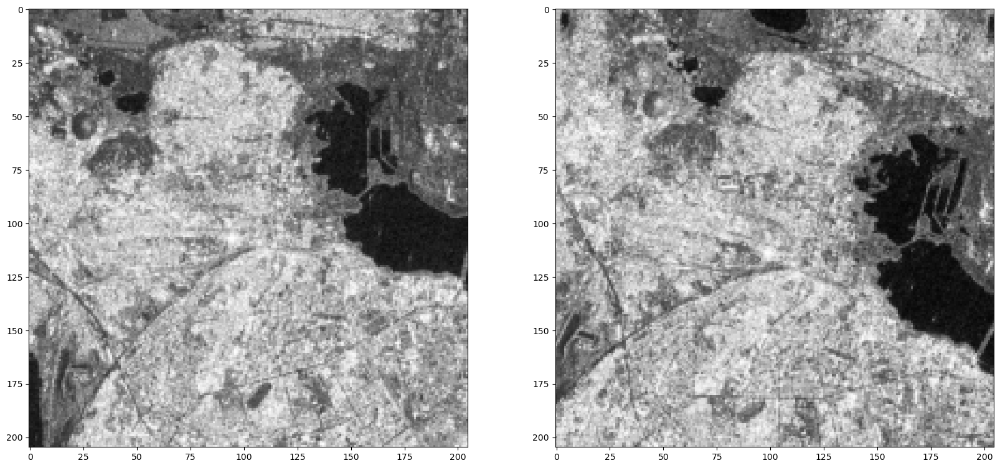

In [82]:
scale = .2
img1_path = "../../TestData/e1.png"
img2_path = "../../TestData/e2.png"

img1 = Image.open(img1_path).convert('RGB')
img2 = Image.open(img2_path).convert("RGB")
img1 = cv2.GaussianBlur(np.array(img1), (9, 9), 2)
img2 = cv2.GaussianBlur(np.array(img2), (9, 9), 2)

img1 = cv2.resize(np.array(img1), dsize=(0, 0), fx=scale, fy=scale)
img2 = cv2.resize(np.array(img2), dsize=(0, 0), fx=scale, fy=scale)


img1_rgb = np.array(img1)
img2_rgb = np.array(img2)

img1_gray = cv2.imread(img1_path, 0)
img2_gray = cv2.imread(img2_path, 0)
fig, ax = plt.subplots(1, 2, figsize=(20, 10))
ax[0].imshow(img1)
ax[1].imshow(img2)

In [85]:
img1 = norm_RGB(img1_rgb)[None] 
xys_img1, desc_img1, scores_img1, reliability_img1, repeatability_img1  = extract_multiscale(net, img1, detector,
                                                                                             min_scale=1,
                                                                                             min_size=64,
                                                                                             max_size=9999,
                                                                                             verbose=True)

extracting at scale x1.00 =  205x205
torch.Size([128, 204, 204])


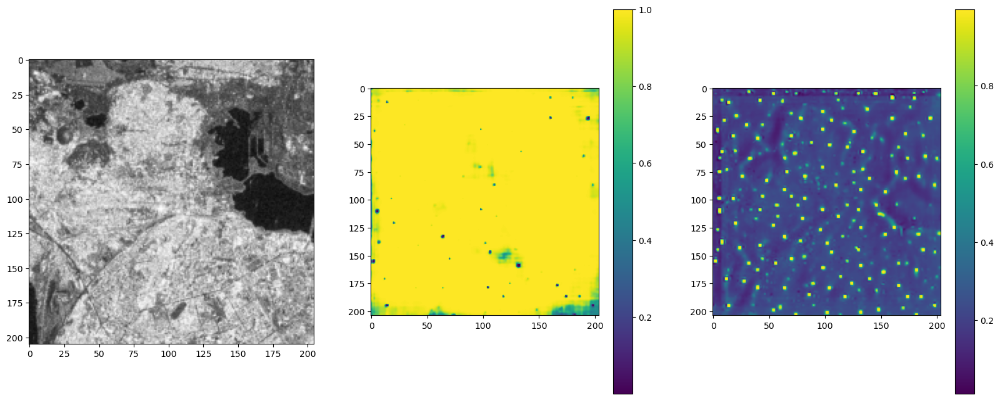

In [86]:
fig, ax = plt.subplots(1, 3, figsize=(20,8))
pos = ax[0].imshow(img1_rgb)
pos = ax[1].imshow(reliability_img1)
plt.colorbar(pos, ax=ax[1])
pos = ax[2].imshow(repeatability_img1)
plt.colorbar(pos, ax=ax[2])

In [87]:
img2 = norm_RGB(img2_rgb)[None] 
xys_img2, desc_img2, scores_img2, reliability_img2, repeatability_img2  = extract_multiscale(net, img2, detector, 
                                                                                             min_scale=1,
                                                                                             min_size=64,
                                                                                             max_size=9999,
                                                                                             verbose=True)

extracting at scale x1.00 =  205x205
torch.Size([128, 204, 204])


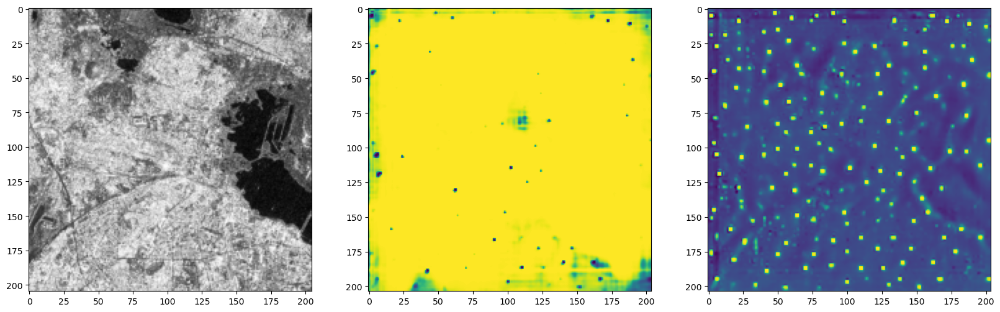

In [88]:
fig, ax = plt.subplots(1, 3, figsize=(20,8))
pos = ax[0].imshow(img2_rgb)
pos = ax[1].imshow(reliability_img2)
pos = ax[2].imshow(repeatability_img2)

In [89]:
# kp1

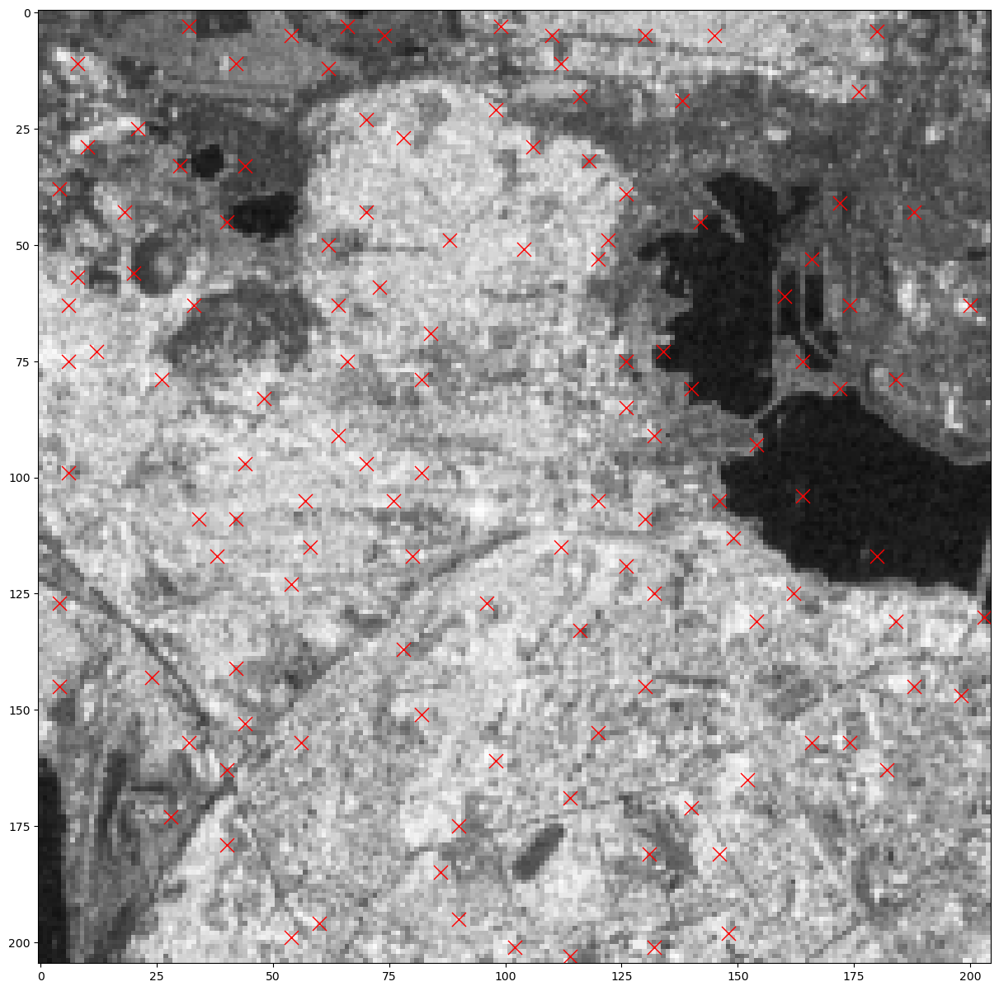

In [90]:
reliability_thr= .01
kps1 = xys_img1.cpu().detach().numpy()
scores1 = scores_img1.cpu().detach().numpy()
descs1 = desc_img1.cpu().detach().numpy()
kp1 = np.array([kp for kp, score, desc in zip(kps1, scores1, descs1) if score>reliability_thr])
desc1 = np.array([desc for kp, score, desc in zip(kps1, scores1, descs1) if score>reliability_thr ])
plt.figure(figsize=(15,15))
plt.imshow(img1_rgb)
plt.scatter(x=kp1[:,0],y=kp1[:,1], marker='x', linewidths=1, c='r', s=150)

In [91]:
desc_img2.shape

torch.Size([122, 128])

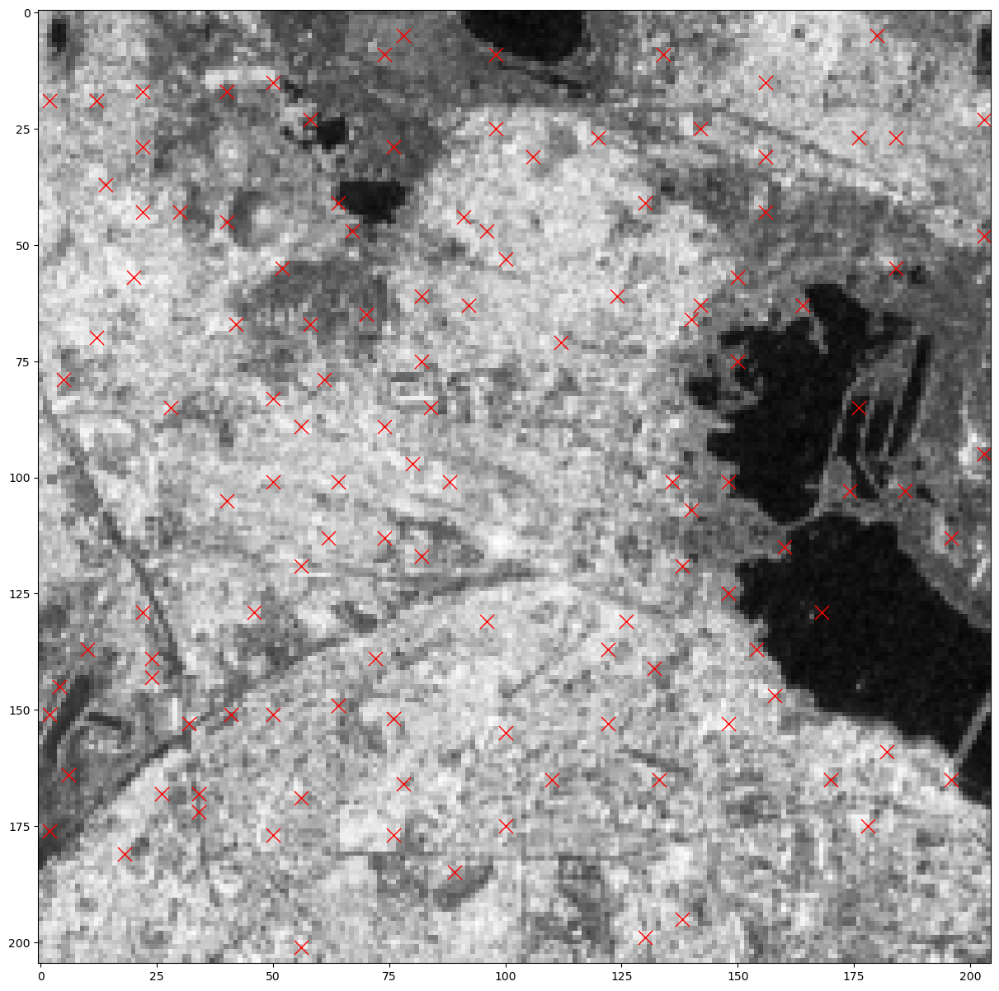

In [92]:
kps2 = xys_img2.cpu().detach().numpy()
scores2 = scores_img2.cpu().detach().numpy()
descs2 = desc_img2.cpu().detach().numpy()
kp2 = np.array([kp for kp, score, desc in zip(kps2, scores2, descs2) if score>reliability_thr])
desc2 = np.array([desc for kp, score, desc in zip(kps2, scores2, descs2) if score>reliability_thr ])
plt.figure(figsize=(15,15))
plt.imshow(img2_rgb)
plt.scatter(x=kp2[:,0],y=kp2[:,1], marker='x', linewidths=1, c='r', s=150)

In [93]:

def mnn_matcher(descriptors_a, descriptors_b):
    device = descriptors_a.device
    sim = descriptors_a @ descriptors_b.t()
    nn12 = torch.max(sim, dim=1)[1]
    nn21 = torch.max(sim, dim=0)[1]
    ids1 = torch.arange(0, sim.shape[0], device=device)
    mask = (ids1 == nn21[nn12])
    matches = torch.stack([ids1[mask], nn12[mask]])
    x = matches.data.cpu().numpy()
    return x


def matcher(desc1, desc2, len_desc=128, score=1):
    hist_height = desc1.shape[0]
    hist_width = desc2.shape[0]
    n_desc = desc1.shape[1] //len_desc
    desc1 = np.split(desc1, n_desc, axis=1)
    desc2 = np.split(desc2, n_desc, axis=1)
    matches = [mnn_matcher(d_a/(np.linalg.norm(d_a, axis=1, keepdims=True) + 1e-10),
                           d_b/(np.linalg.norm(d_b, axis=1, keepdims=True) + 1e-10)) for d_a, d_b in zip(desc1, desc2)]
    histogram = np.zeros((hist_height, hist_width))
    for m in matches:
        histogram[m[0, :], m[1, :]] += 1
    return np.argwhere(histogram>=score), matches

In [94]:
matches = mnn_matcher(desc_img1, desc_img2).T
matches_opencv = [cv2.DMatch(_queryIdx=m ,_trainIdx=n, _imgIdx=0, _distance=0 ) for m, n in matches]


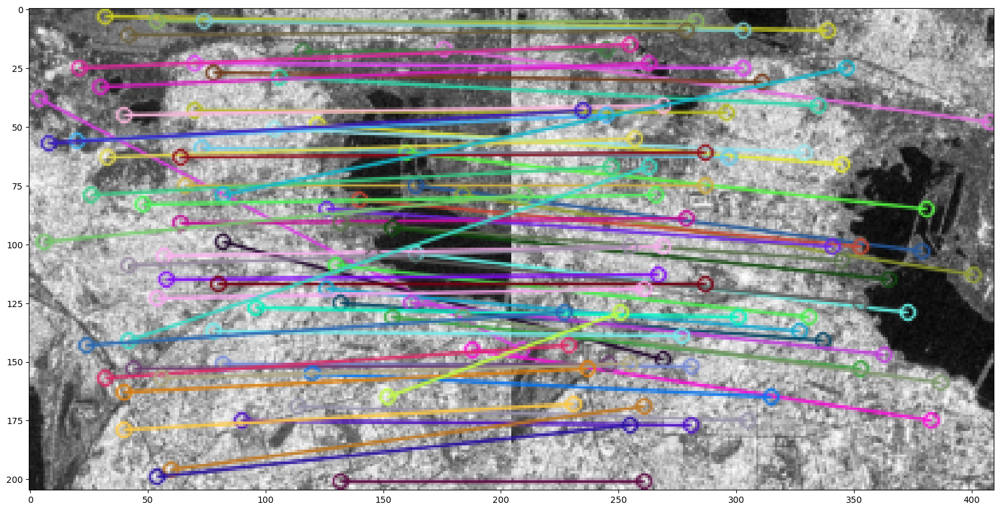

In [95]:
kp1 = cv2.KeyPoint_convert(kps1[:, :2])
kp2 = cv2.KeyPoint_convert(kps2[:, :2])
img = cv2.drawMatches(img1_rgb, kp1, img2_rgb, kp2, matches_opencv, None, flags=2)
plt.figure(figsize=(20, 10))
plt.imshow(img)

In [96]:
pt1 = kps1[:, :2][matches[:, 0]]
pt2 = kps2[:, :2][matches[:, 1]]

In [97]:
tarnsformation, inliers = ransac((pt1, pt2), AffineTransform, 3,3, max_trials=5000)


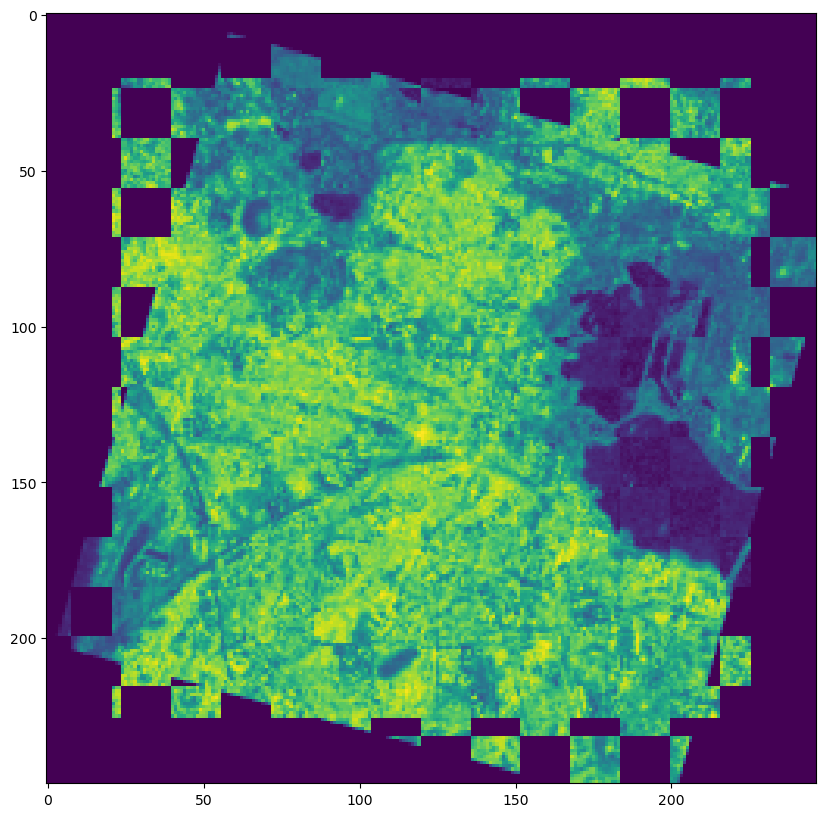

In [98]:
homography = tarnsformation.params
stichImages(img1_rgb[:, :, 0], img2_rgb[:, :, 0], homography, grid_size=16, inverse=True)

In [99]:

def apply_2d_homography(point,h):
    x,y=point
    vec=np.array([x,y,1])
    res = h@vec
    res = res / res[-1]
    return res[:2]

def rotation_transform(thetha):
    transform=np.eye(3)
    transform[0,0]=np.cos(thetha)
    transform[0,1]=np.sin(thetha)
    transform[1,0]=-np.sin(thetha)
    transform[1,1]=np.cos(thetha)
    return transform

def translation(tx,ty):
    transform=np.eye(3)
    transform[0,2]=tx
    transform[1,2]=ty
    return transform

def centered_rotation(thetha,tx,ty):
    return translation(tx,ty)@rotation_transform(thetha)@translation(-tx,-ty)

def rotate_kps(kps, img_shape, angle):
    img_height, img_width = img_shape[:2]
    tx = img_width/2
    ty = img_height/2
    thetha = np.deg2rad(angle)
    rotation_matrix = centered_rotation(thetha, tx, ty)
    rotated_keypoints = []

    rotated_keypoints = [apply_2d_homography(kp, rotation_matrix) for kp in kps]

    return np.array(rotated_keypoints)


def evaluate_matching(src_pts, dst_pts, matches, ground_truth_transform, dist_theshold=2, inliers=None):
    if isinstance(src_pts[0],cv2.KeyPoint) or isinstance(dst_pts[0], cv2.KeyPoint):
        src_pts = [point.pt for point in src_pts]
        dst_pts = [point.pt for point in dst_pts]
    if inliers is None:
        inliers = np.ones(len(matches), dtype='bool')
    cocc = 0
    dist_all = 0
    dist_corrects = 0
    
    for m, n in matches[inliers]:
        pt1 = src_pts[m]
        pt2 = dst_pts[n]
        predicted_pt = apply_2d_homography(pt1,ground_truth_transform)
        dist = np.sum((pt2 - predicted_pt)**2)
        dist_all += dist ** 2
        if dist<= dist_theshold:
            cocc += 1
            dist_corrects += dist**2
    
    rmse_all = np.sqrt(dist_all/len(matches))
    rmse_corrects = np.sqrt(dist_corrects/cocc)
    rocc = cocc/len(matches)
    all_matches = len(matches)
    return rocc,cocc, all_matches,rmse_corrects, rmse_all




In [100]:
coarse_homography = AffineTransform(scale=scale**-1).params @ tarnsformation.params @ AffineTransform(scale=scale).params

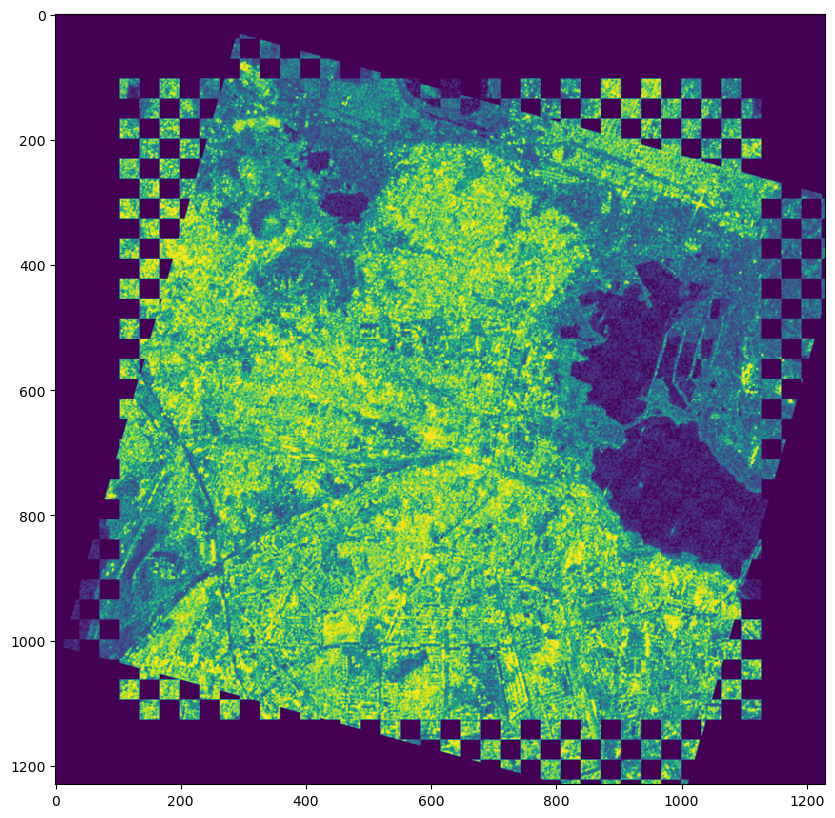

In [101]:
stichImages(img1_gray, img2_gray, coarse_homography, 32)

In [103]:
img1 = Image.open(img1_path).convert('RGB')
img2 = Image.open(img2_path).convert("RGB")
img1 = img1_rgb = np.array(img1)
img2 = img2_rgb = np.array(img2)
# fig, ax = plt.subplots(1, 2, figsize=(20,10))
# ax[0].imshow(img1_rgb)
# ax[1].imshow(img2_rgb)

In [106]:
def get_non_overlapping_rectangles(mask,  width=50, n_patches=3, verbose=False):

    m, n = np.argwhere(mask).T
    top_left_m, top_left_n = m.min(), n.min()
    button_left_m, button_left_n = m.max(), n.max()
    mask_height, mask_width = mask.shape[:2]
    m_vector = np.arange(top_left_m , button_left_m , width)
    n_vector = np.arange(top_left_n  , button_left_n , width)

    m, n = np.meshgrid(m_vector, n_vector)

    all_locs = [(m, n) for m, n in zip(m.flatten(), n.flatten())]
    filtered_all_locs = []
    for m, n in all_locs:
        if m-width//2 > 0 and  n-width//2> 0 and m+width//2 < mask_height and n+width < mask_width:
            if mask[m-width//2, n-width//2] and mask[m+width//2, n+width//2] and mask[m-width//2, n+width//2 ] and \
                mask[m+width//2, n-width//2] : 
                filtered_all_locs.append((m, n))
            
    all_locs = np.array(filtered_all_locs)
    np.random.shuffle(filtered_all_locs)
    plane_map = np.zeros_like(mask)
    selected_locs = filtered_all_locs[:n_patches]
    if verbose:
        for m, n in selected_locs:
            ms, ns = draw.rectangle((m-width//2, n-width//2), (m+width//2, n+width//2), shape=mask.shape[:2])
            plt.scatter(n, m)
            plane_map[ms, ns]  = 1

        plt.imshow(plane_map*mask)
        plt.imshow(mask, alpha=.5)
        plt.show()

    return selected_locs

In [107]:
def extract_descriptors(img, net, detector, wanted_layers=[ 22, 20, 17 , 14, 11, 7, 4, 1]):
    _, _, height, width = img.shape
    layers = []
    for module in net.modules():
        layers.append(module)
    layers = layers[2:]
    activation = {}
    def get_activation(name):
        def hook(model, input, output):
            activation[name] = output.detach()
        return hook
    for idx in wanted_layers:
        layers[idx].register_forward_hook(get_activation(idx))

    with torch.no_grad():
        xys_img, D, scores, ret_reliability, ret_repeatability  = extract_multiscale(net, img, detector, min_size=16, min_scale=1,max_size=9999)
    kps = xys_img[:, :2]
    features = []
    for key_name in activation:
        features.append(torchvision.transforms.functional.resize(activation[key_name], [height, width]).detach().numpy())
    # return features, kps.detach().numpy()
    return features, xys_img, D, scores, ret_reliability, ret_repeatability

In [108]:
x = norm_RGB(img1_rgb)[None] 

In [109]:
x.shape

torch.Size([1, 3, 1024, 1024])

In [111]:

def patch_based_key_point_extraction(img1, img2, net, detector, transformation_mat, reliability_thr= .99 , n_patches=5, patch_width=128, patch_border=25 ):
    # all_patches_2 = []
    mask = np.ones_like(img2)[..., 0]
    border = 10 
    helper_mask = np.zeros_like(mask)
    helper_mask[border: -border, border: -border] = 1
    coarse_tr = ProjectiveTransform(transformation_mat)
    mask_img2 = helper_mask * mask

    mask_img1 = warp(mask_img2, coarse_tr, preserve_range=True)
   
    mask_img1 = mask_img1 * helper_mask
    mask_img2 = warp(mask_img1, coarse_tr.inverse, preserve_range=True)
    # plt.imshow(mask_img2)
    # plt.show()
    # plt.imshow(mask_img1)
    # plt.show()
    patch_locs = get_non_overlapping_rectangles(mask_img1, patch_width, n_patches, verbose=False)
    kp1, desc1 = [], []
    kp2, desc2 = [], []
    
    fig, ax = plt.subplots(1, 2, figsize=(20, 10))
    ax[0].imshow(img1)
    ax[0].imshow(mask_img1, alpha=.5)
    ax[1].imshow(img2)
    ax[1].imshow(mask_img2, alpha=.5)

    patch_width = patch_width + 2*patch_border
    

    for n, m in patch_locs:
        ms = m - patch_width//2
        ns = n -patch_width//2 
        me = m + patch_width//2 + 1
        ne = n + patch_width//2 + 1
#         ax[0].scatter(m, n)
        rect = patches.Rectangle((ms, ns), patch_width, patch_width, linewidth=1, edgecolor='b', facecolor='none')
        ax[0].add_patch(rect)
        patch1 = img1[ns:ne, ms:me]
        # kp_img_1, desc_img_1 = feat_extractor.detectAndCompute(patch1, None)
        patch1 = norm_RGB(patch1)[None]
        
        features1, xys_img1, _, scores_img1, reliability_img1, repeatability_img1 = extract_descriptors(patch1, net, detector)
        
        
        # print([f.shape for f in features1])
        kps1 = xys_img1.cpu().detach().numpy()
        scores1 = scores_img1.cpu().detach().numpy()
        # desc_img_1 = desc_img1.cpu().detach().numpy()
        filtered_kps1 = kps1[scores_img1.cpu().detach().numpy()>reliability_thr]
        filtered_kps1 = np.array([ [m, n, _] for m, n, _ in filtered_kps1 if m>patch_border and n >patch_border and m < (patch_width-patch_border) and n< (patch_width-patch_border)])
        # filtered_desc1 = np.array([desc for kp, score, desc in zip(kps1, scores1, features1) if score>reliability_thr])
        if len(filtered_kps1) == 0 :
            print("nothing found")
            continue
        kp_img_1 = cv2.KeyPoint_convert(filtered_kps1[:, :2])
        
        for nn, mm, _ in filtered_kps1.astype('int'):
        # for mm, nn, _ in filtered_kps1.astype('int'):
            
            current_pt = []
            for f in features1:
                current_pt.append(f[0, :, mm, nn])
            desc1.append(current_pt)
            
        for kp in kp_img_1:
            x = kp.pt[0] + ms 
            y = kp.pt[1] + ns 
            kp.pt = (x, y)
            # kp.pt = (kp.pt[0] + ns, kp.pt[1] + ms)
            ax[0].scatter(x, y, marker='x', c='r', s=100)
            kp1.append(kp)
        
        tr_m, tr_n = apply_2d_homography((m, n), transformation_mat)
        tr_me, tr_ne = apply_2d_homography((me, ne), transformation_mat)
        tr_width = ((tr_m - tr_me)**2 + (tr_n - tr_ne)**2)**.5/2**.5*2
        # tr_width *= .9
        
#         ax[1].scatter(tr_m, tr_n)
        tr_m_s = int(tr_m - tr_width // 2)
        tr_n_s = int(tr_n - tr_width // 2)
        tr_m_e = int(tr_m + tr_width // 2)
        tr_n_e = int(tr_n + tr_width // 2)
        rect = patches.Rectangle((tr_m_s, tr_n_s), tr_width, tr_width, linewidth=1, edgecolor='b', facecolor='none')
        ax[1].add_patch(rect)

        patch2 = img2[tr_n_s: tr_n_e, tr_m_s: tr_m_e]
        # all_patches_2.append(patch2)
        patch2 = norm_RGB(patch2)[None]
        features2, xys_img2, _, scores_img2, reliability_img2, repeatability_img2 = extract_descriptors(patch2, net, detector)
       

        kps2 = xys_img2.cpu().detach().numpy()
        scores2 = scores_img2.cpu().detach().numpy()
        # desc_img_2 = desc_img2.cpu().detach().numpy()
        filtered_kps2 = kps2[scores_img2.cpu().detach().numpy()>reliability_thr]
        filtered_kps2 = np.array([ [m, n, _] for m, n, _ in filtered_kps2 if m>patch_border and n >patch_border and m < (patch_width-patch_border) and n < (patch_width-patch_border)])
        if len(filtered_kps2) == 0 :continue
        kp_img_2 = cv2.KeyPoint_convert(filtered_kps2[:, :2])
        
        for nn, mm, _ in filtered_kps2.astype('int'):
        # for mm, nn, _ in filtered_kps2.astype('int'):
            
            current_pt = []
            for f in features2:
                current_pt.append(f[0, :, mm, nn])
            desc2.append(current_pt)
        # kp_img_2, desc_img_2 = feat_extractor.detectAndCompute(patch2, None)
        # desc2.extend(filtered_desc2)
        for kp in kp_img_2:
            x = kp.pt[0] + tr_m_s 
            y = kp.pt[1] + tr_n_s 
            kp.pt = (x, y )
            # kp.pt = (kp.pt[0] + tr_n_s, kp.pt[1] + tr_m_s)
            ax[1].scatter(x, y, marker='x', c='r', s=100)
            
            kp2.append(kp)

    return kp1, desc1, kp2, desc2


torch.Size([128, 178, 178])
torch.Size([128, 178, 178])
torch.Size([128, 178, 178])
torch.Size([128, 178, 178])
torch.Size([128, 178, 178])
torch.Size([128, 178, 178])
torch.Size([128, 178, 178])
torch.Size([128, 178, 178])
torch.Size([128, 178, 178])
torch.Size([128, 178, 178])


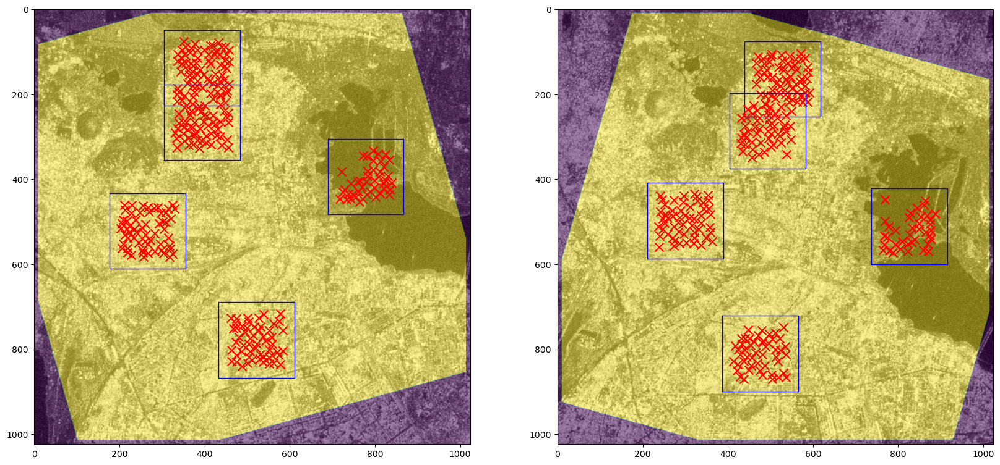

In [112]:
open_cv_kp1, desc1, open_cv_kp2, desc2 = patch_based_key_point_extraction(img1_rgb, img2_rgb, net, detector,
                                                          coarse_homography,0.5,5, patch_width=128, patch_border=25)

In [113]:
# stichImages(img1_gray, img2_gray, coarse_homography, 64)

In [114]:
kp1 = np.array([k.pt[::-1] for k in open_cv_kp1])
kp2 = np.array([k.pt[::-1] for k in open_cv_kp2])

In [115]:
desc1[2][0].shape

(32,)

In [116]:
descs_img1 = np.array(desc1, dtype=object)
descs_img2 = np.array(desc2, dtype=object)
# descs_img1 = desc1
# descs_img2 = desc2

In [117]:
k1 = kp1[:, :2].astype('int32')
k2 = kp2[:, :2].astype('int32')

In [121]:
tr_k1 = AffineTransform(coarse_homography)(k1[:, ::-1])
# tr_k1 = ProjectiveTransform(coarse_homography)(k1)
# tr_k1 = np.array([apply_2d_homography(pt, np.linalg.inv(coarse_homography)).tolist() for pt in k1[:, ::]])
# tr_k1 = np.array([apply_2d_homography(pt, coarse_homography).tolist() for pt in k1[:, ::-1]])

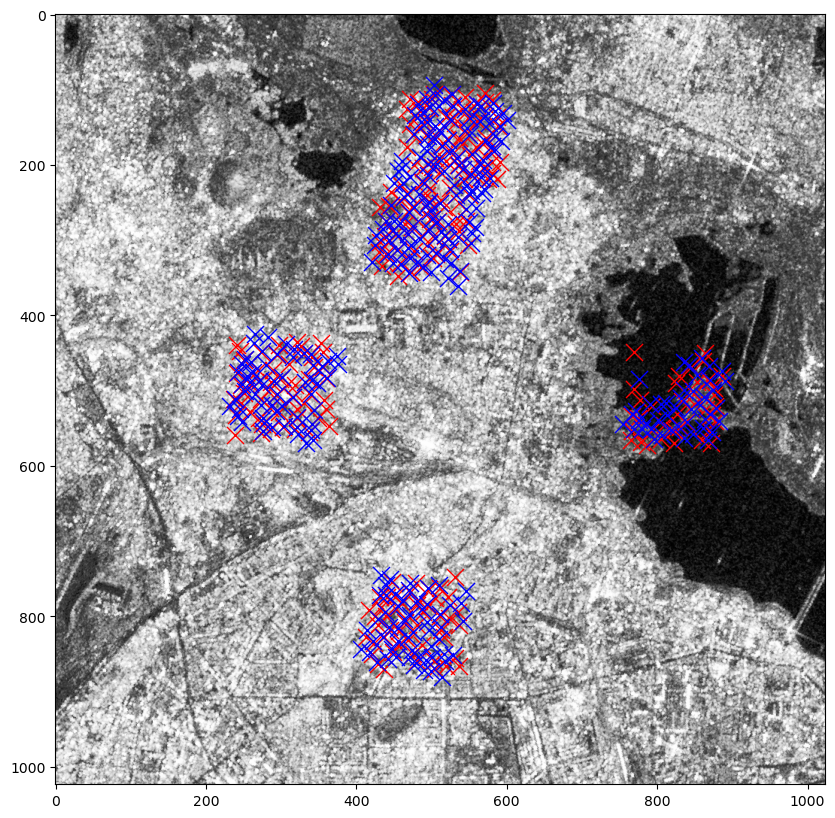

In [122]:
plt.figure(figsize=(10,10))
plt.imshow(img2_rgb)
plt.scatter(x=k2[:,1],y=k2[:,0], marker='x', linewidths=1, c='r', s=150)
plt.scatter(x=tr_k1[:,0],y=tr_k1[:,1], marker='x', linewidths=1, c='b', s=150)

In [123]:

def mnn_matcher(descriptors_a, descriptors_b):
    device = descriptors_a.device
    sim = descriptors_a @ descriptors_b.t()
    nn12 = torch.max(sim, dim=1)[1]
    nn21 = torch.max(sim, dim=0)[1]
    ids1 = torch.arange(0, sim.shape[0], device=device)
    mask = (ids1 == nn21[nn12])
    matches = torch.stack([ids1[mask], nn12[mask]])
    x = matches.data.cpu().numpy()
    return x

In [145]:
descs_img1.T.shape

(8, 288)

In [146]:
desc_img1[-1:].shape

torch.Size([1, 128])

In [201]:
dist = np.sum((tr_k1[:, None, ::-1] - k2[None, :, :])**2, axis=-1)**.5

radius = 15

mask = dist < radius

histograms = np.zeros(shape=(len(k1), len(k2)))

n_descs = 4 #minimum number of matches

# for desc1, desc2 in zip(descs_img1.T[-1:], descs_img2.T[-1:]):
for desc1, desc2 in zip(descs_img1.T, descs_img2.T):
    dd1 = np.array(desc1.tolist())
    dd2 = np.array(desc2.tolist())
    
    # desc_dist = np.sum((dd1[:, None, :] * dd2[None, :, :]), axis=-1)
    desc_dist = dd1 @ dd2.T
    # desc_dist = np.sum((dd1[:, None, :] - dd2[None, :, :])**2, -1)
    # desc_dist[ desc_dist] = 0
    desc_dist_masked = np.where(mask, desc_dist, -np.inf)

#     match12 = np.argmin(desc_dist_masked, axis=1)
#     match21 = np.argmin(desc_dist_masked, axis=0)
    
    match12 = np.argmax(desc_dist_masked, axis=1)
    match21 = np.argmax(desc_dist_masked, axis=0)
    mask_mutual_matches = np.equal(match21[match12], np.arange(0, len(match12)))
   

    m = np.c_[np.arange(len(desc_dist)), match12]
    m = m[mask_mutual_matches]
    match12 = np.delete(m, np.argwhere(m[:, 1]==0), axis=0)
    
    histograms[match12[:, 0], match12[:, 1]] += 1

In [202]:
histograms.max()

8.0

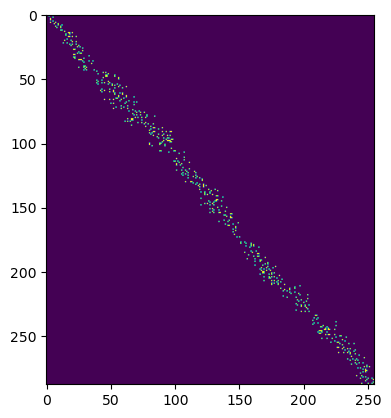

In [209]:
plt.imshow(mask)

In [212]:
final_matches = np.argwhere(histograms>n_descs)

In [213]:
len(final_matches)

81

In [214]:
d_matches  = [cv2.DMatch(_queryIdx=m ,_trainIdx=n, _imgIdx=0, _distance=0 ) for m, n in final_matches]

In [215]:
len(open_cv_kp2)

255

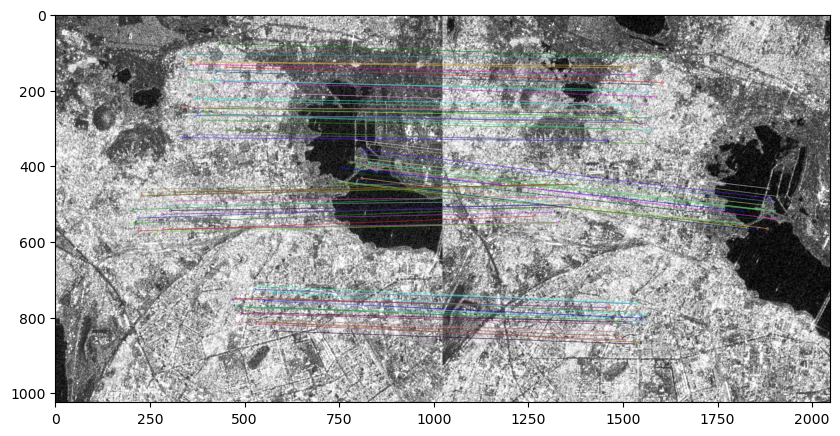

In [216]:
x = cv2.drawMatches(img1_rgb, open_cv_kp1, img2_gray, open_cv_kp2, d_matches, None,flags=2 )
plt.figure(figsize=(10, 20))
plt.imshow(x)

In [217]:
pt1 = kp1[:, :2][final_matches[:, 0]][:, ::-1]
pt2 = kp2[:, :2][final_matches[:, 1]][:, ::-1]

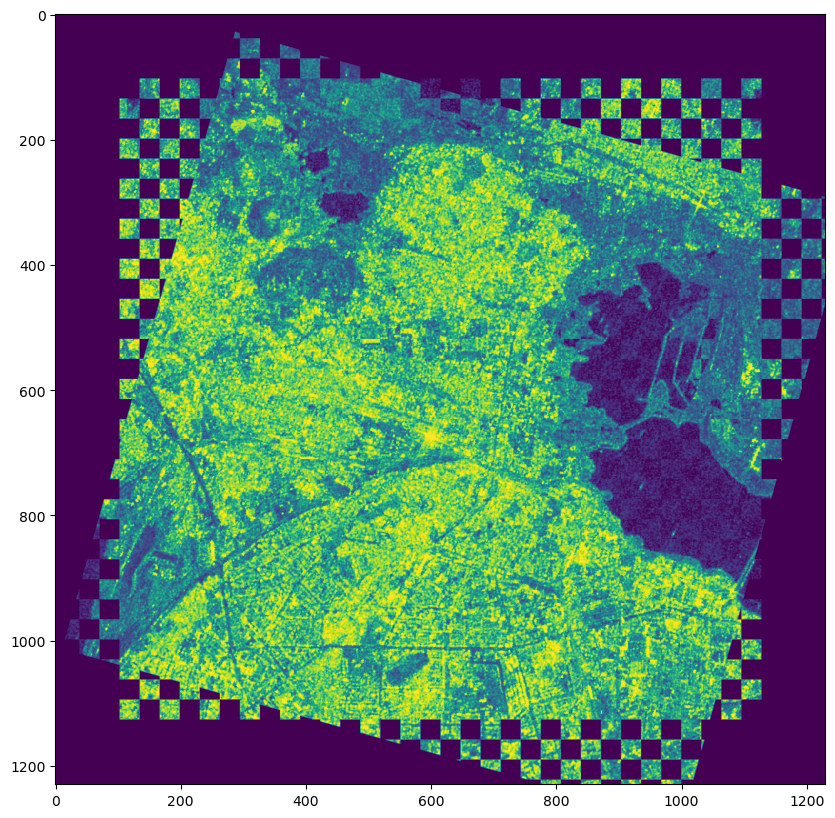

In [218]:
transformation, inliers = cv2.findHomography(pt1, pt2, method=cv2.USAC_ACCURATE,maxIters=100000)
stichImages(img1_rgb[:, :, 0], img2_rgb[:, :, 0], transformation, grid_size=32, inverse=True)

In [219]:
x = AffineTransform()

In [220]:
x.estimate(pt1, pt2)

True

In [221]:
x.params

array([[  0.96085464,  -0.270169  , 185.30203596],
       [  0.2675286 ,   0.96233208, -74.27487355],
       [  0.        ,   0.        ,   1.        ]])

In [224]:
# matches = match_descriptors(desc1, desc2)

transform, inliers = ransac(data=(pt1, pt2),
                            model_class=AffineTransform, min_samples=3,
                            residual_threshold=5, max_trials=5000)

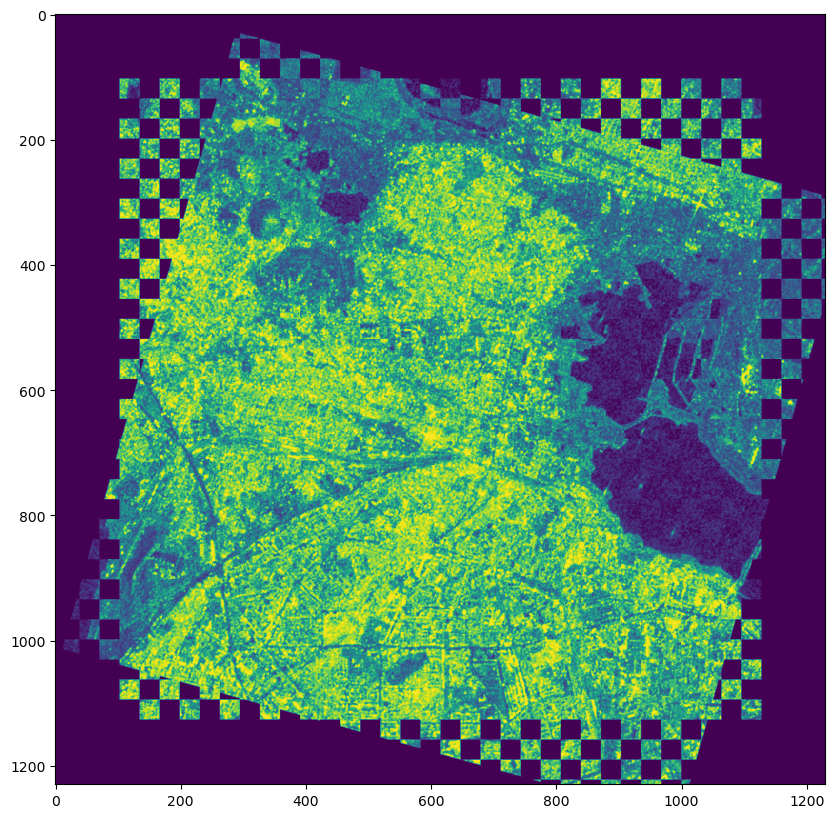

In [225]:
# stichImages(img1_rgb[:, :, 0], img2_rgb[:, :, 0], transform.params, grid_size=64, inverse=False)
stichImages(img1_rgb[:, :, 0], img2_rgb[:, :, 0], x.params, grid_size=32, inverse=False)

In [226]:
np.sum(inliers), len(inliers)

(58, 81)